# Processing photos
In this chapter, we will look at the `SampleImageHandlerMSI`, which fetches the measurement area from the .mis file, and the `Image` classes, which can find the sample area (the measurement area, in general, does not cover the entire sediment sample, so it is important to make this distinction), punch holes, holes in general, light and dark areas and layers.

Later, we will also briefly look at the `SampleImageHandlerXRF`, which has similar features as the `SampleImageHandlerMSI`, but instead can locate the measurement region based on a photo of a subregion. 

## `SampleImageHandlerMSI`
Let's first look at the `SampleImageHandlerMSI`.

In [1]:
%matplotlib inline

from maspim import get_project
import user_params

path_folder = user_params.path_folder_test_data

project = get_project(is_MSI=True, path_folder=path_folder)
handler = project.require_image_handler()

C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


We can check that the d-folder, mis and image file were determined correctly:

In [2]:
print(handler)

path_folder: C:\Users\Yannick Zander\Downloads\maspim workshop\data\small example
mis_file: 13012023_SBB_TG3A_05-10_Test2.mis
d_folder: small example.d
image_file: SBB_TG3A_05-10_test0001.tif
_extent_spots: [75, 85, 54, 69]


We can use the handler to determine the measurement area from the points specified in the mis file and load the right image:

In [3]:
handler.image_file

'SBB_TG3A_05-10_test0001.tif'

## `ImageSample`
we can use the image file determined by the handler to initialize the `ImageSample` instance:

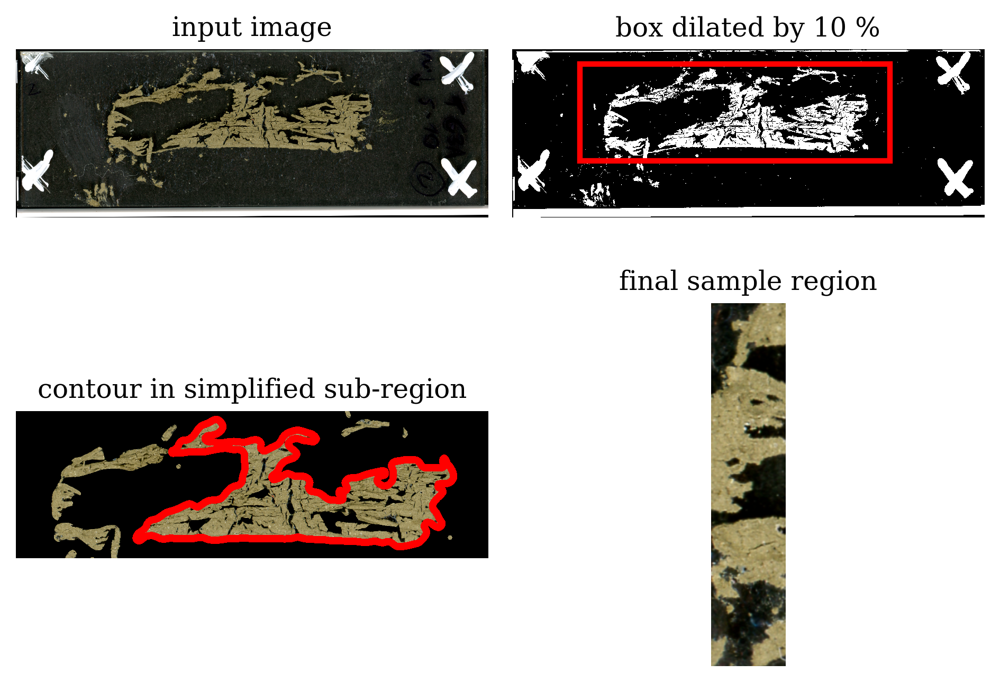

In [4]:
project.set_image_sample(obj_color='light', use_extent_from_mis=False)
project.image_sample.plot_overview()

The class will determine the sample extent by evoking an optimizer (maximizing the contrast between the sample and surroundings). It is important that the object color is determined correctly because the optimizer requires knowledge of whether the sediment is brighter or darker than the background (in our case we want to see the object color to be determined as *'light'*

In [5]:
project.image_sample.obj_color

'light'

What happens if you don't provide the obj_color? Before trying it, take a guess (light/dark):

In [6]:
from tasks import chapter3_task1
chapter3_task1.ask()

We could also draw the bounding rectangle by hand (add one point at the top left and one at the bottom right by pressing the left mouse button and then close the figure using the middle mouse button, you need a bit of patience because the image resolution is quite high but you can also skip this)

In [7]:
project.image_sample.set_sample_area(interactive=True)

That's not very fun, especially if you have to do it for >20 figures. So let's stick to the optimizer version.

Unfortunately, though, the optimizer does not always work correctly. Sometimes it is difficult to tell where the sample ends when it overlaps with the apparatus at the sides of the image. For those cases we can fall back to the region defined in the mis file: Although the measurement region does not coincide with the sample region, for sediment samples the measurement region usually covers the entire length, so we can use the depth-wise extent defined in the mis file. 

For the small example that will not work because the measured area is much smaller but this is the better option for our full example which we will use from now on.

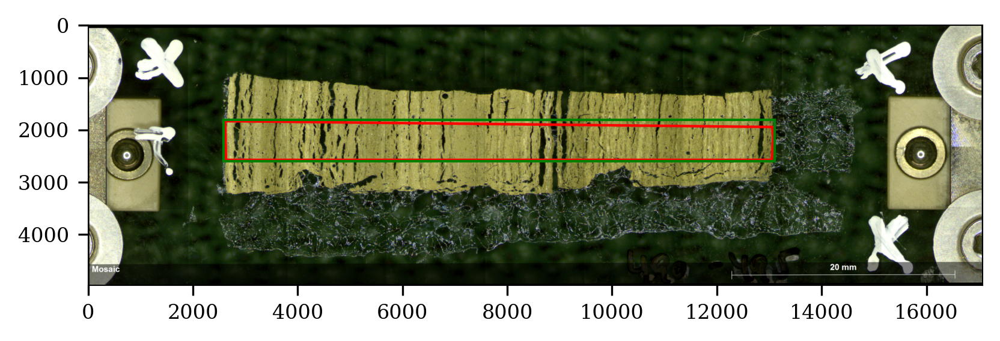

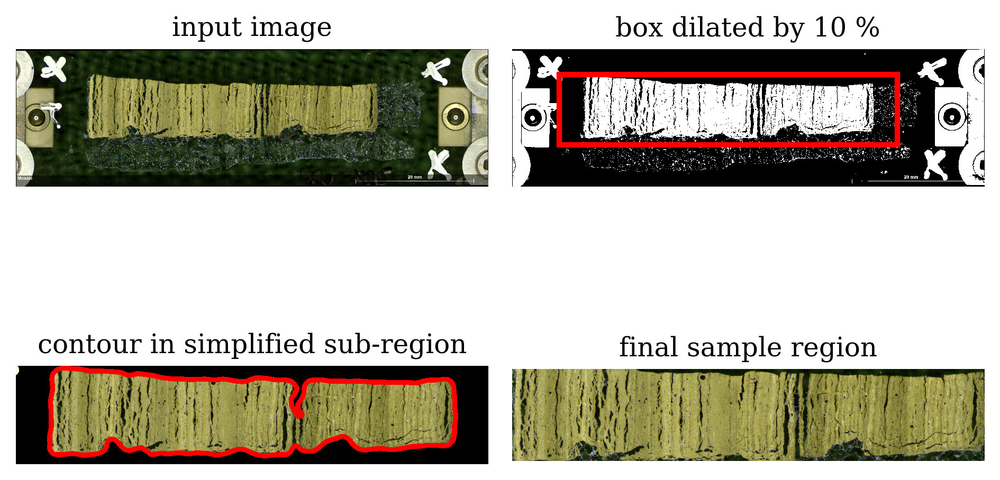

In [8]:
from maspim import get_project
from user_params import path_folder_real_data
%matplotlib inline

project = get_project(is_MSI=True, path_folder=path_folder_real_data)
project.require_image_handler()
project.image_handler.plot_overview()
project.require_image_sample()
project.image_sample.plot_overview()

By the way, the top-right image is the result of the optimizer, except that the area is enlarged slightly for a second fine-tuning step in which the contour of the sample is determined from a smoothed image. The bottom-right image always shows the cached sample area (this may be different from the previous two images if you set the sample area manually).

## `ImageROI`
Next in line is the `ImageROI` object. Its purpose is to prepare the laminae identification and set the punch holes. Punch holes are used to reference samples to each other.

  0%|                                                                                            | 0/6 [00:00<?, ?it/s]C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\skimage\util\dtype.py:576: UserWarning: Downcasting int32 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)
100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.61it/s]


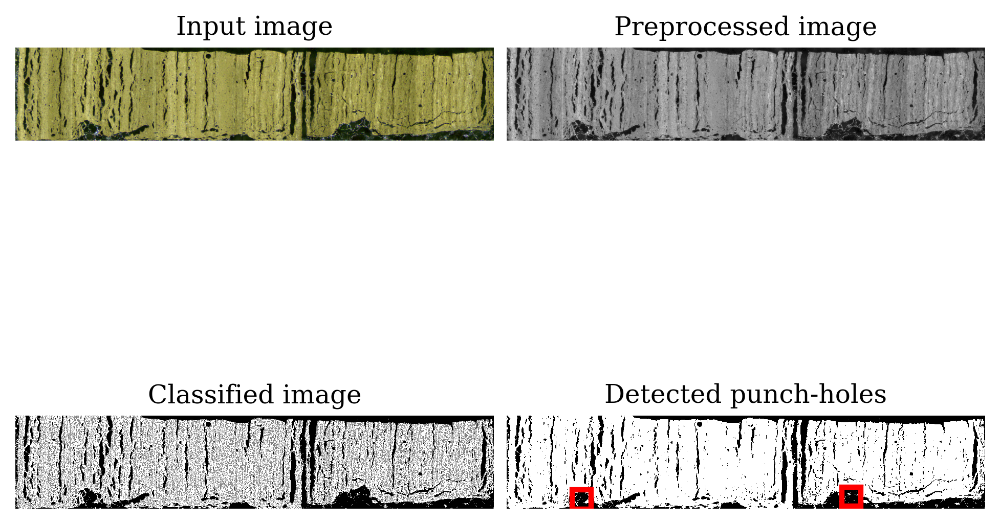

In [9]:
project.require_image_roi()
project.image_roi.plot_overview()

Here we can see the function falling back to a method that does not require an age model to determine the width of layers (it combines contrast information from many scales). Usually choosing the kernel size based on the age model performs much better. In this tutorial we left out the age model chapter so here you have to trust me that the 5 cm section covers roughly 100 years which is enough information for our purposes

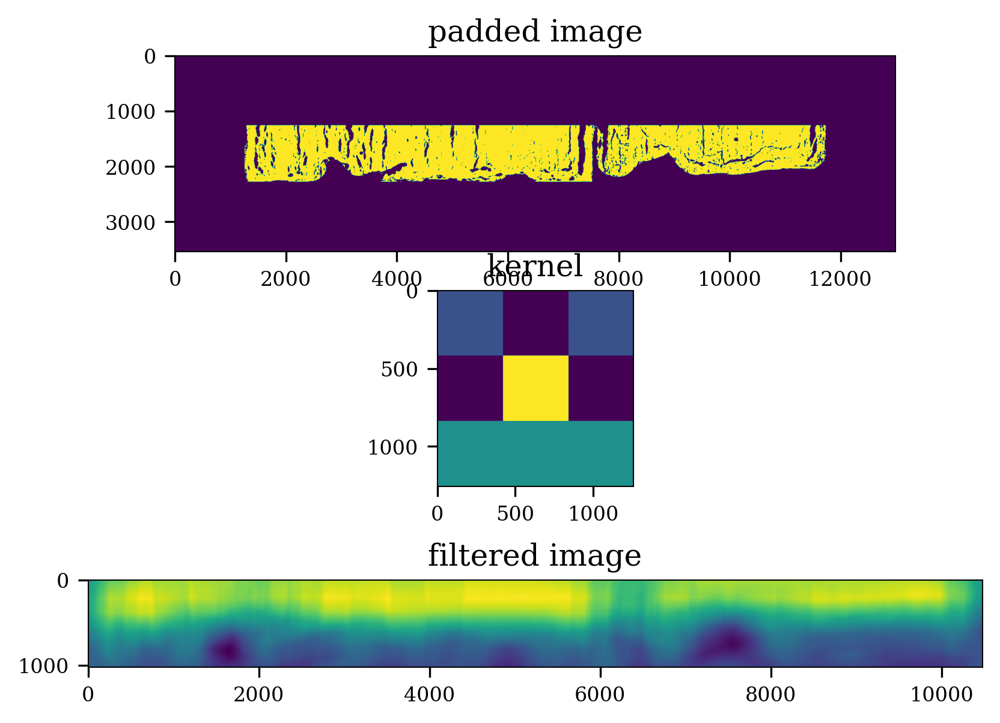

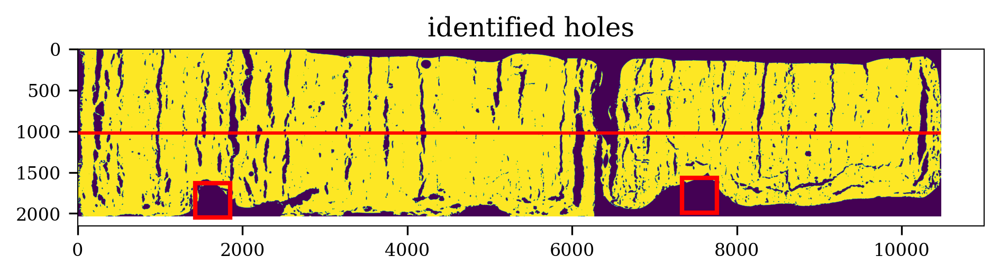

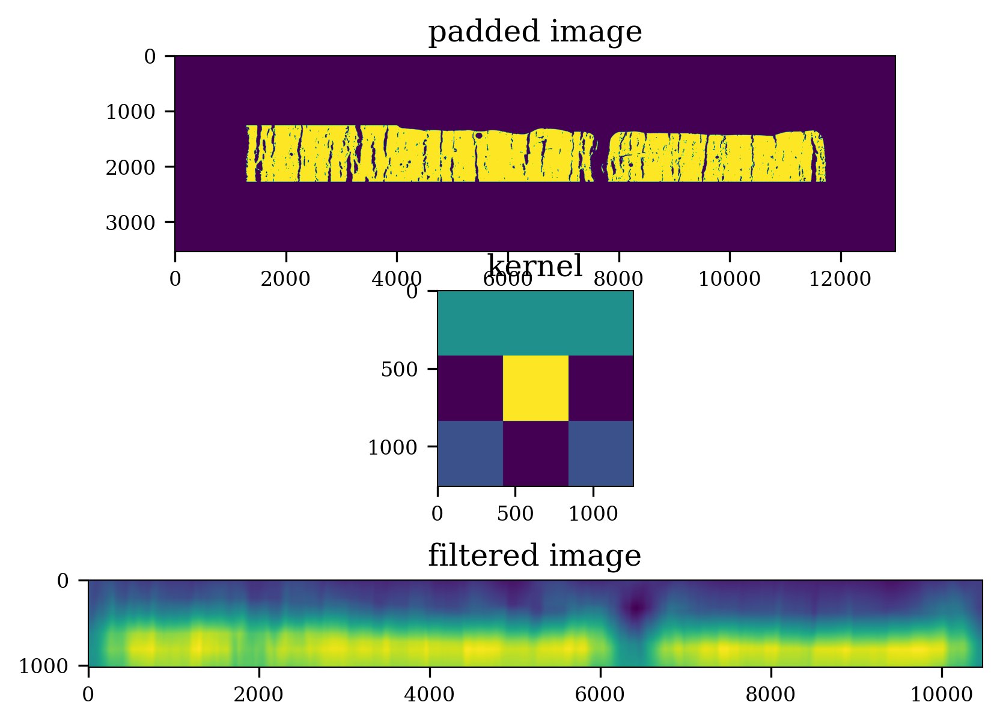

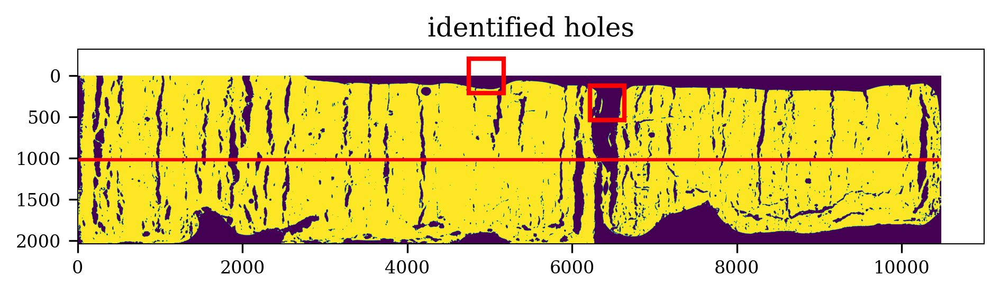

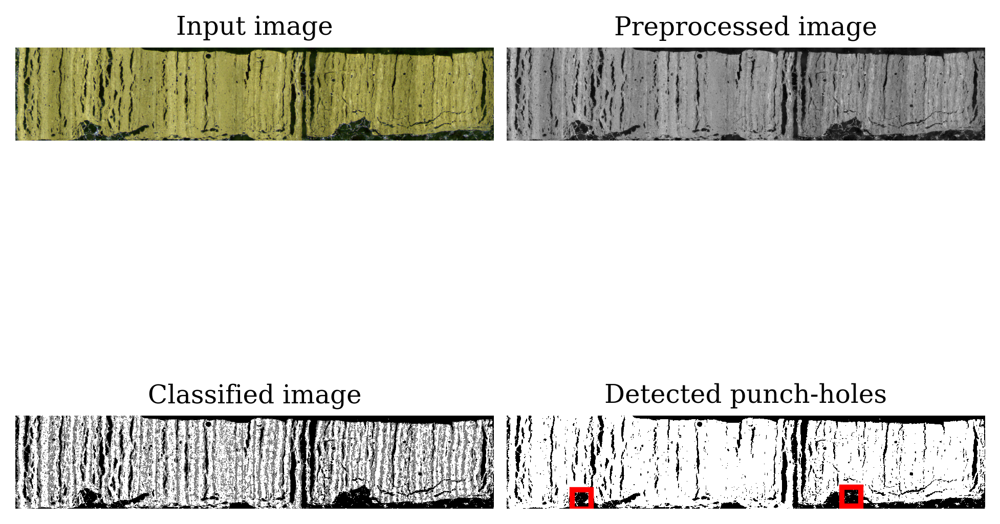

In [10]:
project.image_roi.age_span = (0, 100)
project.image_roi.require_classification(overwrite=True)
project.image_roi.set_punchholes(plts=True)
project.image_roi.plot_overview()

In [11]:
project.image_roi.mask_foreground.max()

255

In [12]:
True / True

1.0

That looks better.

### Quiz
Which of the following best describes the kernel that is used for identifying the punch holes? 

In [13]:
from tasks import chapter3_task2 as task

task.options()
task.ask()

The following options are available (you can enter the number of the answer):
(1) a bunny face
(2) a sunset
(3) a hat with ears


By the way, if you are not happy with the punch hole identification, you once again can set them manually with

In [14]:
project.image_roi.set_punchholes(interactive=True)

## `ImageClassified`
Now we want to take the light/dark classification to get individual layers. Right now we cannot distinguish one white layer from another. This step is highly specific for laminated sediments. The `ImageClassified` class has one other application which is to correct any non-horizontal layers. Even if your sample is not laminated, it may have a few distinctive layers in it (disclaimer: I have not tested the tilt correction for non-layered sediments yet). More generally you can think of this step as a way of setting us up to find some regions that may be useful to distinguish. Later on, we will see how to feed that information into our feature table from Chapter 2. 

The tilt descriptor is discussed in more detail in chapter 6 of the notebooks on [github](https://github.com/yaza11/maspim/tree/master/Notebooks) so we will not worry about any of the options here. Just keep in mind that the project getter assumes laminated sediments by default and laminated sediments will be tilt corrected you should provide `is_laminated=False` to `get_project` if your samples are not laminated). 

setting unique values: 100%|█████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 37.00it/s]


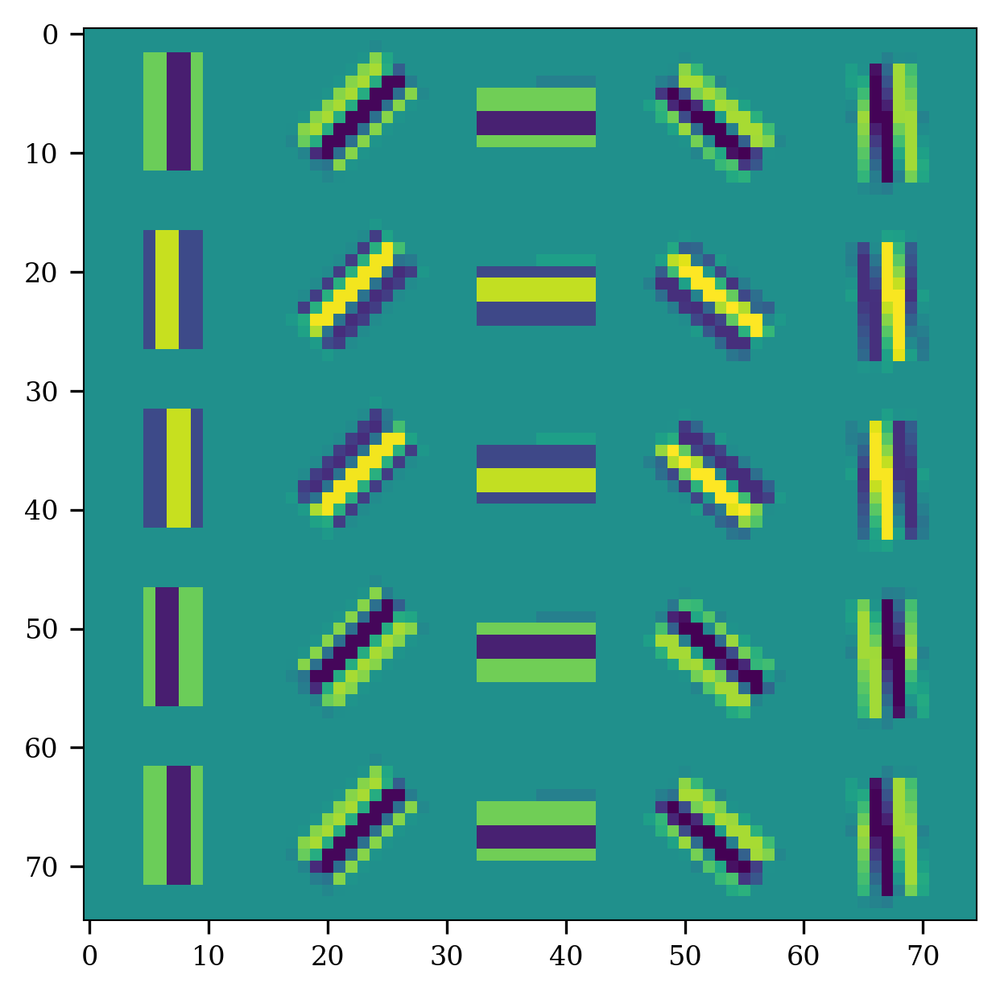

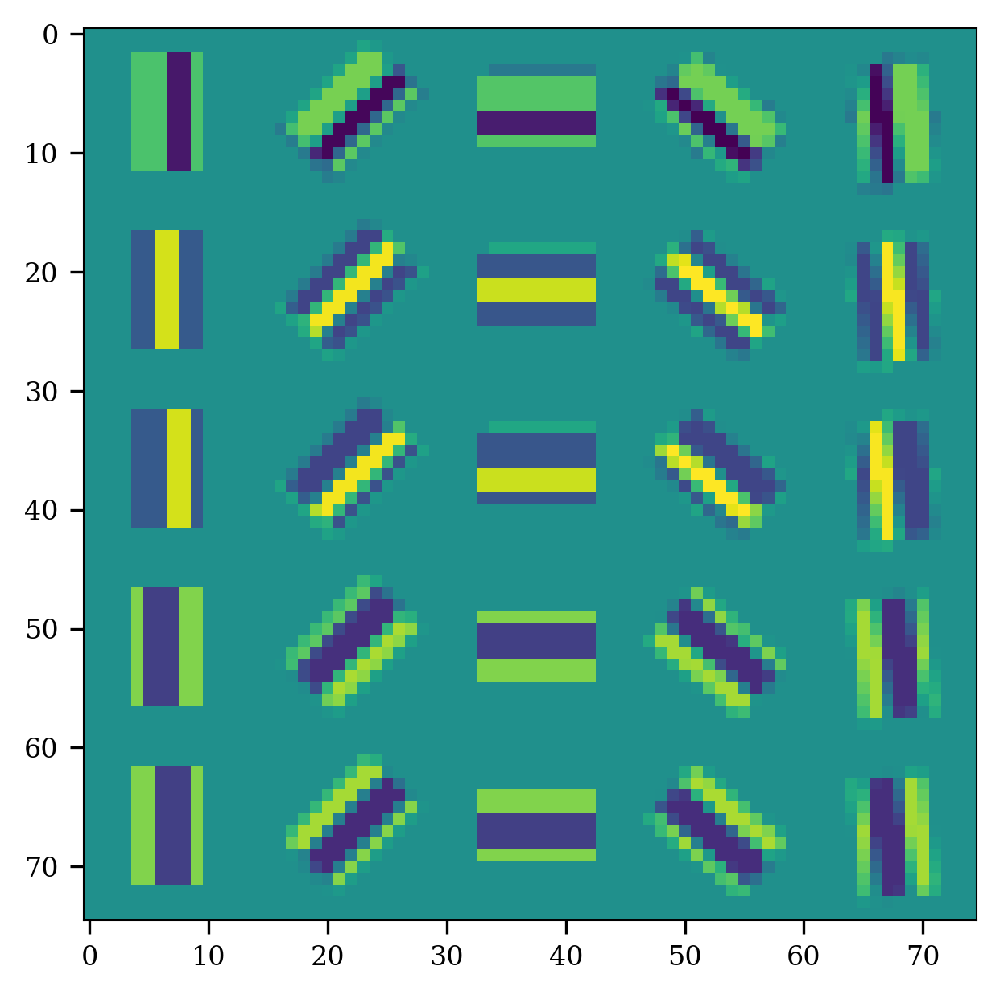

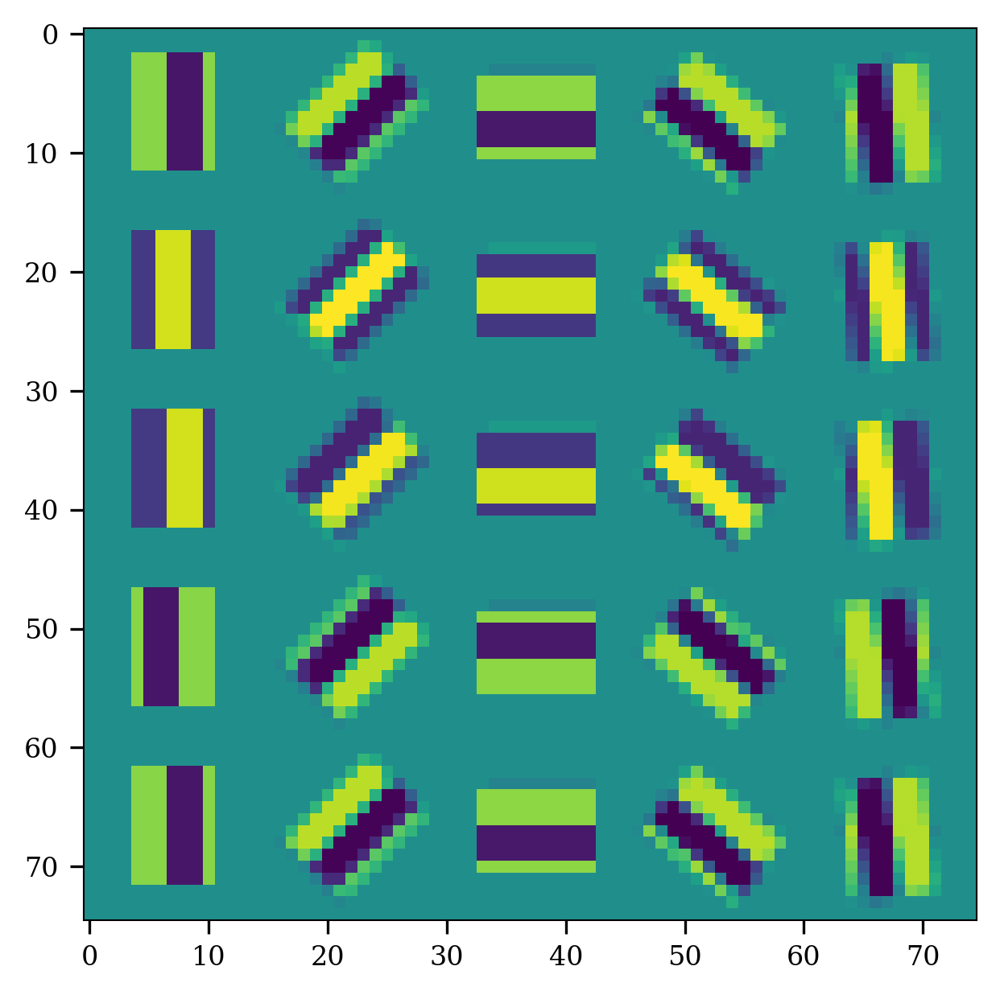

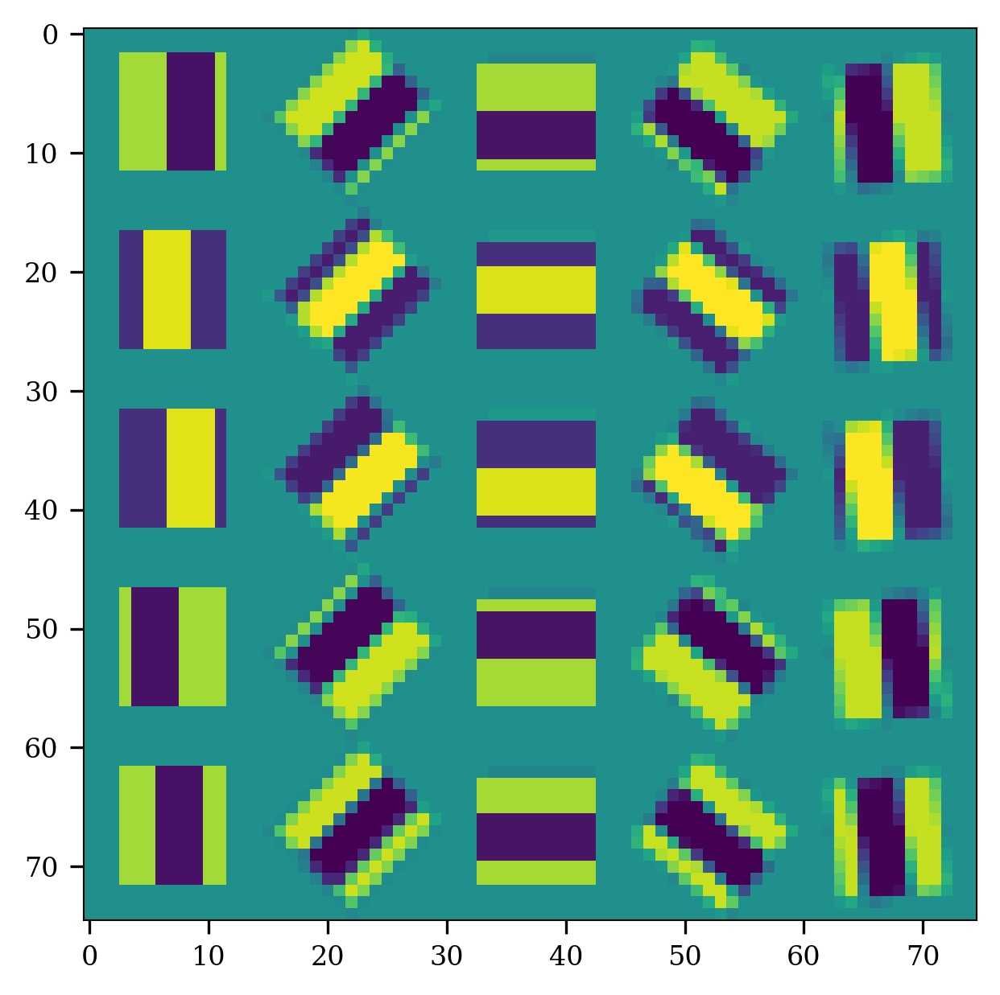

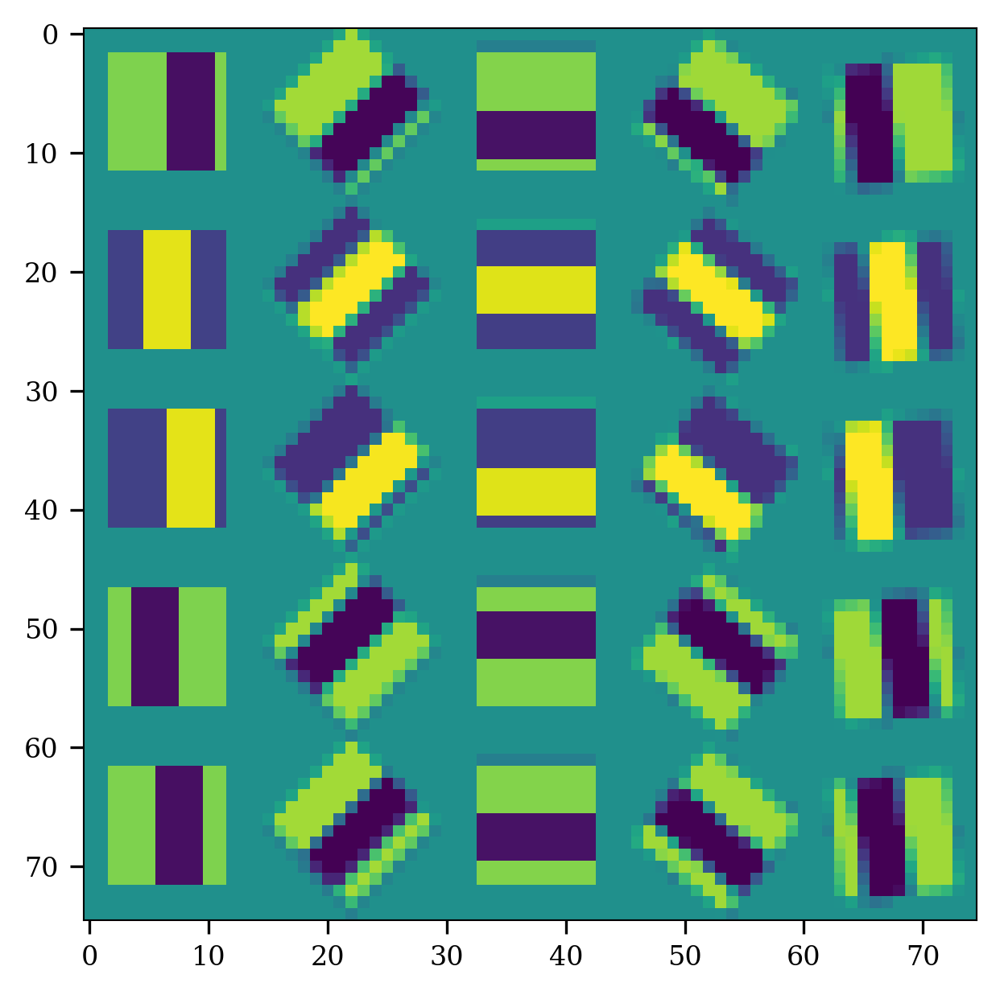

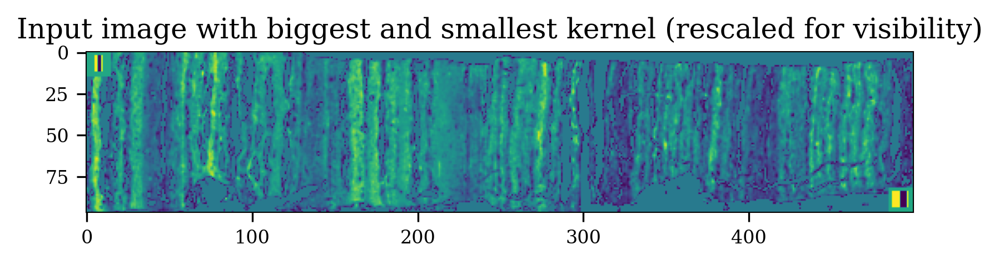

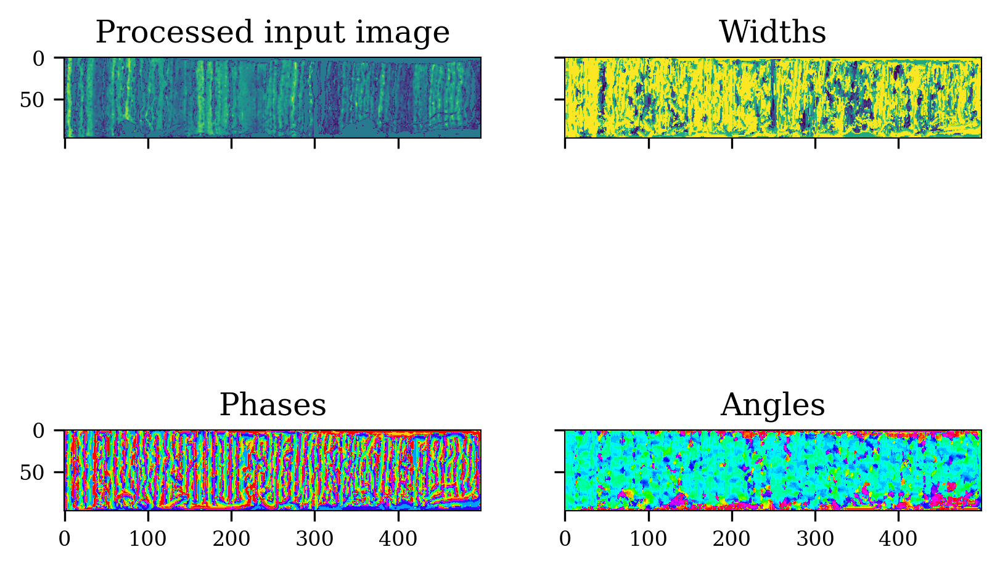

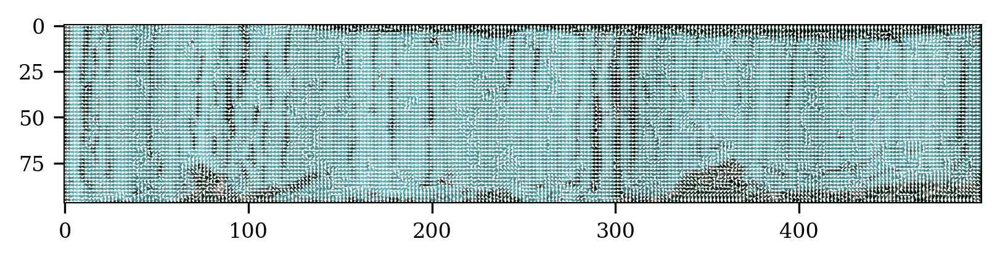

_image_shape: [2039, 10477]
_Us: [[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]]
_Vs: [[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]]
path_folder: C:\Users\Yannick Zander\Downloads\maspim workshop\data\full example
_tag: tilt_correction

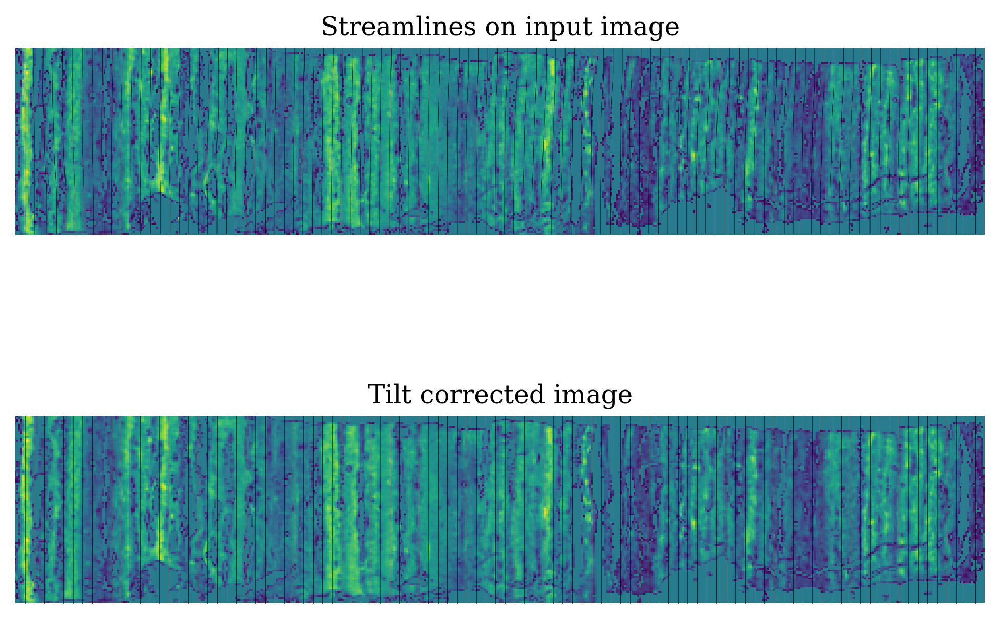

In [15]:
import math
project.require_tilt_corrector(overwrite=False, 
                               plts=True, 
                               angles_min=math.radians(-22.5), 
                               angles_max=math.radians(22.5), 
                               mute_bounds=.1, 
                               ny_cells=3, 
                               use_mask=True)

### Quiz
Why could it be useful to restrict the angles?

In [16]:
from tasks import chapter3_task3

chapter3_task3.options()
chapter3_task3.ask()

The following options are available (you can enter the number of the answer):
(1) To make the decision for the descriptor less difficult
(2) To avoid areas at the sample boundary
(3) To save memory


I recommend that you start working on another chapter while this finishes or loading a checkpoint because this will take a few minutes

In [17]:
option = input('Press enter to load the checkpoint, otherwise anything else')
load_checkpoint = len(option) == 0

Press enter to load the checkpoint, otherwise anything else \


In [18]:
if load_checkpoint:
    from user_params import copy_checkpoint
    copy_checkpoint(3)
else:
    project.image_classified.set_laminae_params_table(height0_mode='use_age_model')

Setting simplified laminae: 100%|████████████████████████████████████████████████████| 200/200 [00:10<00:00, 18.69it/s]


In [19]:
project.image_classified._image.shape

(2039, 10477, 3)

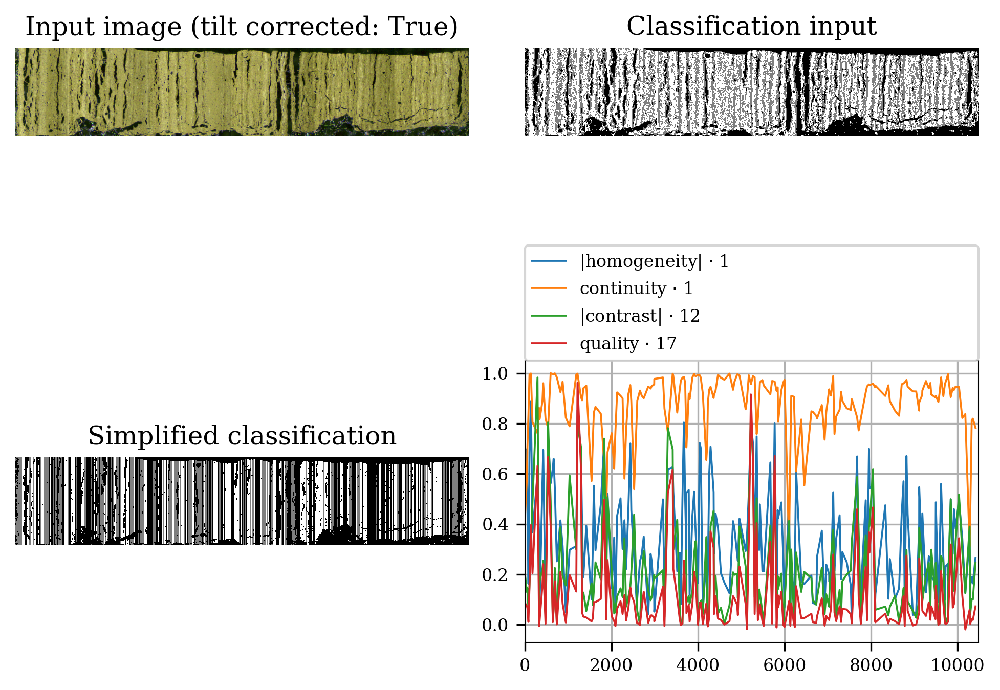

In [20]:
project.image_classified.plot_overview()

In [21]:
project.image_classified.save()